<a href="https://colab.research.google.com/github/juanfernandezgracia/xarxa_fonologia_llengues/blob/master/xarxes_llengues_null_model_Pablo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Phonological language network (null model)

First we randomize columns to compute z-score of modularity.

In [ ]:
!pip install infomap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.8/264.8 kB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for infomap: filename=infomap-2.8.0-cp310-cp310-linux_x86_64.whl size=7695877 sha256=0c00ceb8ccc5902b01f90d6644fe94891c4c3277c56f014db4cb73ad4105b44e
  Stored in directory: /root/.cache/pip/wheels/b5/0c/9b/9816a0207b931219a0c5b2edc14d84099ddd57f7097f926b16
Successfully built infomap


In [ ]:
# necessary modules and defined functions
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import random
from infomap import Infomap
from collections import defaultdict
from networkx.algorithms import bipartite
# Function to generate a random color
def random_color():
    return "#{:06x}".format(random.randint(0, 0xFFFFFF))
# %%
def plot_bipartite_network_horizontal(G,path_fout):
    plt.figure(figsize=(60, 18))
    plt.box(False)
    top_nodes, bottom_nodes = bipartite.sets(G)
    pos = nx.bipartite_layout(G, top_nodes)
    weights = np.array([0.5*G.edges[edge]['weight']
                            for edge in G.edges()])
    strength_dict = dict(G.degree(G.nodes(),
                                    weight='weight'))
    sorted_top_nodes = sorted(top_nodes,
                            key=lambda x: strength_dict[x],
                            reverse=True)
    sorted_bottom_nodes = sorted(bottom_nodes,
                                key=lambda x: strength_dict[x],
                                reverse=True)
    all_sorted_nodes = sorted_top_nodes + sorted_bottom_nodes
    G_sorted = nx.Graph()
    G_sorted.add_nodes_from(all_sorted_nodes)
    G_sorted.add_edges_from(G.edges(data=True))
    pos = dict()
    # Place top nodes at x=0
    for i, node in enumerate(sorted_top_nodes):
        pos[node] = (1-float((len(top_nodes)-1)-i)/(len(top_nodes)-1), 1)
    # Place bottom nodes at x=1
    for i, node in enumerate(sorted_bottom_nodes):
        pos[node] = (1-float((len(bottom_nodes)-1)-i)/(len(bottom_nodes)-1), 0)
    sizes = [75*strength_dict[x] for x in G_sorted.nodes()]
    nx.draw_networkx_nodes(G_sorted,
                        pos,
                        node_color=['peachpuff' if n in top_nodes
                                    else 'orchid' for n in G.nodes()],
                        node_size=sizes)
    # print(weights_CC_M)
    # Draw edges sorted by weight so that higher weighted edges appear on top
    for u, v, d in sorted(G.edges(data=True), key=lambda x: x[2]['weight']):
        # print(d)
        nx.draw_networkx_edges(G,
                            pos,
                            edgelist=[(u, v)],
                            width=d['weight'],
                            #    edge_cmap=mpl.colormaps['jet'],
                            edge_color=mpl.colormaps['viridis'](float(d['weight'])/max(weights)),
                            alpha=0.7)

    # Draw node labels
    text = nx.draw_networkx_labels(G,
                            pos,
                            labels=dict(zip(top_nodes,top_nodes)),
                            font_size=10,
                            font_weight='bold')
    for _, t in text.items():
        t.set_rotation(45)
    text = nx.draw_networkx_labels(G,
                            pos,
                            labels=dict(zip(bottom_nodes,bottom_nodes)),
                            font_size=50)
    plt.savefig(path_fout, bbox_inches='tight')


In [ ]:
# load dataframe
lang_df = pd.read_excel('fonologia transposat_complet_MDPN.xlsx',index_col=None)
lang_df = lang_df.set_index('Language').T
lang_df.head()


Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure,Família,Gènere
Abipón,1,1,3,1,1,1,2,2,1,3,Guaicuruan,Abipon
Abkhaz,2,4,2,4,1,3,5,1,1,3,Northwest Caucasian,Northwest Caucasian
Aché,1,1,1,1,2,1,1,2,1,1,Maweti-Guarani,Tupian
Acoma,1,1,1,2,5,2,5,2,1,2,Keresan,Keresan
Aghem,4,4,1,3,1,1,3,3,1,2,Niger-Congo,Wide Grassfields


In [ ]:
lang_df.describe()

Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure,Família,Gènere
count,481,481,481,481,481,481,481,481,481,481,481,481
unique,5,4,4,6,5,8,5,3,4,3,152,320
top,2,2,1,1,1,1,3,2,1,2,Niger-Congo,Oceanic
freq,216,156,400,375,336,349,177,244,447,273,49,16


In [ ]:
# get rid of familia and genere to work only with phonological characteristics
lang_df_nofam = lang_df.drop(columns=['Família', 'Gènere'])
lang_df_nofam = lang_df_nofam.astype(float)
lang_df_nofam.describe()

Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure
count,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000
mean,1.873181,2.324324,1.295218,1.455301,1.869023,1.746362,2.841996,2.180873,1.110187,2.182952
std,1.083267,1.200178,0.707223,0.978188,1.485169,1.392731,1.186725,0.678945,0.449908,0.632291
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000
50%,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,1.000000,2.000000
75%,2.000000,4.000000,1.000000,1.000000,2.000000,2.000000,4.000000,3.000000,1.000000,3.000000
max,5.000000,4.000000,4.000000,7.000000,5.000000,8.000000,5.000000,3.000000,4.000000,3.000000


In [57]:
# standarized

from sklearn.preprocessing import MinMaxScaler
columns_to_scale = lang_df_nofam.columns[:]
min_max_scaler = MinMaxScaler()
lang_df_nofam_scaled = lang_df_nofam.copy()
lang_df_nofam_scaled[columns_to_scale] = min_max_scaler.fit_transform(lang_df_nofam[columns_to_scale])

## mean and standard deviation for the modularity of the communities obtained by Infomap performing randomization of the columns

In [72]:
# randomize columns with scaling

n_randomizations = 30
i_r = 0

modularities = []

while i_r < n_randomizations:

  lang_df_nofam_rc = lang_df_nofam_scaled.copy()
  for column in lang_df_nofam_scaled.columns:
    lang_df_nofam_rc[column] = np.random.permutation(lang_df_nofam_scaled[column])

  # correlations
  corr_mat = lang_df_nofam_rc.T.corr('pearson')
  langs = list(corr_mat.index)

  # %% create network with rho_th=0.7
  thres = 0.7
  G_lang = nx.Graph()
  for index, row in corr_mat.iterrows():
      for lang in langs:
          if lang != index:
              if np.abs(row[lang]) > thres:
                  G_lang.add_edge(index, lang, weight=row[lang])
  # adding familia and genere as attributes of the network
  family_dict = dict(zip(langs,list(lang_df['Família'])))
  nx.set_node_attributes(G_lang,family_dict,'Familia')
  family_dict = dict(zip(langs,list(lang_df['Gènere'])))
  nx.set_node_attributes(G_lang,family_dict,'Genere')

  if nx.is_connected(G_lang):

    i_r += 1

    # getting communities with infomap
    im = Infomap()
    mapping = im.add_networkx_graph(G_lang)
    im.run()

    # create communities dictionary and add it as a node attribute
    communities_dict = {}
    for node in im.tree:
        if node.is_leaf:
            communities_dict[im.names[node.node_id]] = node.module_id
    N_comm = np.max(list(communities_dict.values()))
    communities_im = N_comm*[[]]
    for i in range(N_comm):
        communities_im[i] = [node for node in communities_dict.keys() if communities_dict[node]==i+1]
    nx.set_node_attributes(G_lang,communities_dict,'Community')

    #modularity
    modularity = nx.algorithms.community.quality.modularity(G_lang, communities_im)

    modularities.append(modularity)

    print(f"Modularity for connected realization {i_r}: {modularity}.")

mean_modularity = np.mean(modularities)
std_modularity = np.std(modularities)

z_score = (0.27678-mean_modularity)/std_modularity

print(f"z-score of modularity: {z_score}.")


Modularity for connected realization 1: 0.15406648220251584.
Modularity for connected realization 2: 0.13781035612570916.
Modularity for connected realization 3: 0.13485951540560123.
Modularity for connected realization 4: 0.36202106448435506.
Modularity for connected realization 5: 0.10468969284623608.
Modularity for connected realization 6: 0.3846098615594598.
Modularity for connected realization 7: 0.1199062386335028.
Modularity for connected realization 8: 0.36082911958922276.
Modularity for connected realization 9: 0.3518857519085661.
Modularity for connected realization 10: 0.16486092842501762.
Modularity for connected realization 11: 0.33792791064706096.
Modularity for connected realization 12: 0.3997065876879853.
Modularity for connected realization 13: 0.35107490040812894.
Modularity for connected realization 14: 0.3411655049902334.
Modularity for connected realization 15: 0.3542898877349191.
Modularity for connected realization 16: 0.149996528454851.
Modularity for connected 

In [74]:
# randomize columns without scaling

modularities = []
i_r = 0

while i_r < n_randomizations:

  lang_df_nofam_rc = lang_df_nofam.copy()
  for column in lang_df_nofam.columns:
    lang_df_nofam_rc[column] = np.random.permutation(lang_df_nofam[column])

  # correlations
  corr_mat = lang_df_nofam_rc.T.corr('pearson')
  langs = list(corr_mat.index)

  # %% create network with rho_th=0.75
  thres = 0.75
  G_lang = nx.Graph()
  for index, row in corr_mat.iterrows():
      for lang in langs:
          if lang != index:
              if np.abs(row[lang]) > thres:
                  G_lang.add_edge(index, lang, weight=row[lang])
  # adding familia and genere as attributes of the network
  family_dict = dict(zip(langs,list(lang_df['Família'])))
  nx.set_node_attributes(G_lang,family_dict,'Familia')
  family_dict = dict(zip(langs,list(lang_df['Gènere'])))
  nx.set_node_attributes(G_lang,family_dict,'Genere')

  # getting communities with infomap
  im = Infomap()
  mapping = im.add_networkx_graph(G_lang)
  im.run()

  # create communities dictionary and add it as a node attribute
  communities_dict = {}
  for node in im.tree:
      if node.is_leaf:
          communities_dict[im.names[node.node_id]] = node.module_id
  N_comm = np.max(list(communities_dict.values()))
  communities_im = N_comm*[[]]
  for i in range(N_comm):
      communities_im[i] = [node for node in communities_dict.keys() if communities_dict[node]==i+1]
  nx.set_node_attributes(G_lang,communities_dict,'Community')

  if nx.is_connected(G_lang):

    i_r += 1

    #modularity
    modularity = nx.algorithms.community.quality.modularity(G_lang, communities_im)

    modularities.append(modularity)

    print(f"Modularity for connected realization {i_r}: {modularity}.")

    modularities.append(modularity)

mean_modularity = np.mean(modularities)
std_modularity = np.std(modularities)

z_score = (0.524619429198895-mean_modularity)/std_modularity

print(f"z-score of modularity: {z_score}.")


Modularity for connected realization 1: 0.4283530242692628.
Modularity for connected realization 2: 0.5490476017855994.
Modularity for connected realization 3: 0.5451730979224219.
Modularity for connected realization 4: 0.558304135128148.
Modularity for connected realization 5: 0.5666973796514219.
Modularity for connected realization 6: 0.5547322362835573.
Modularity for connected realization 7: 0.5485805178170542.
Modularity for connected realization 8: 0.5701011381763237.
Modularity for connected realization 9: 0.5717894501872421.
Modularity for connected realization 10: 0.5636049089074577.
Modularity for connected realization 11: 0.5589588091170036.
Modularity for connected realization 12: 0.5562567975125607.
Modularity for connected realization 13: 0.5359092036456973.
Modularity for connected realization 14: 0.5548766178341524.
Modularity for connected realization 15: 0.5442301982483109.
Modularity for connected realization 16: 0.5267006514981747.
Modularity for connected realizati

# Lo demás

In [51]:
# layout and weights for network plotting also familias and colors
weights = np.array([G_lang.edges[edge]['weight'] for edge in G_lang.edges()])
layout = nx.fruchterman_reingold_layout(G_lang)
familias = set(family_dict.values())
color_dict = {familia: random_color() for familia in familias}

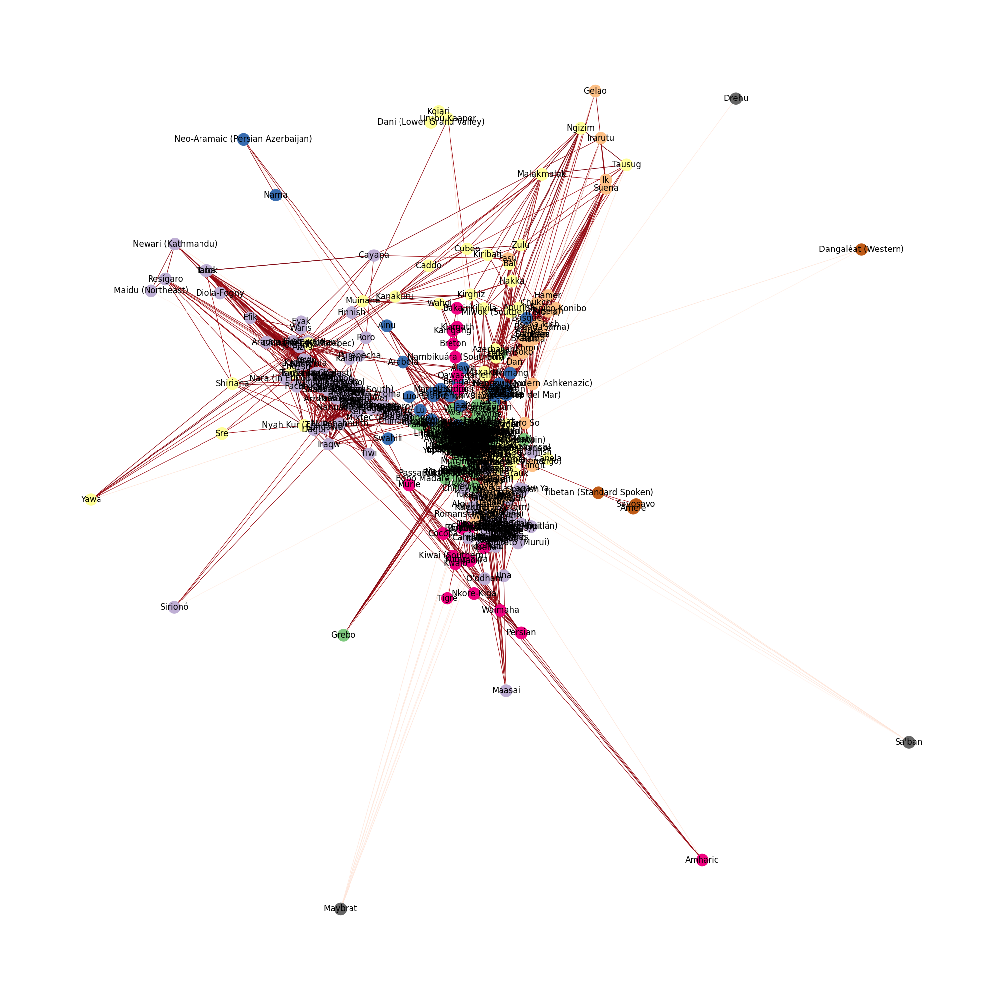

In [52]:
# plot network with communities
plt.figure(figsize=(20,20))
nx.draw(G_lang,
        pos=layout,
        edge_color=weights,
        width=np.array(weights),
        with_labels=True,
        node_color=[communities_dict[node] for node in G_lang.nodes()],
        edge_cmap=plt.cm.Reds,
        cmap=plt.cm.Accent)

plt.box(False)


/home/juanf/anaconda3/envs/phonology/lib/python3.12/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


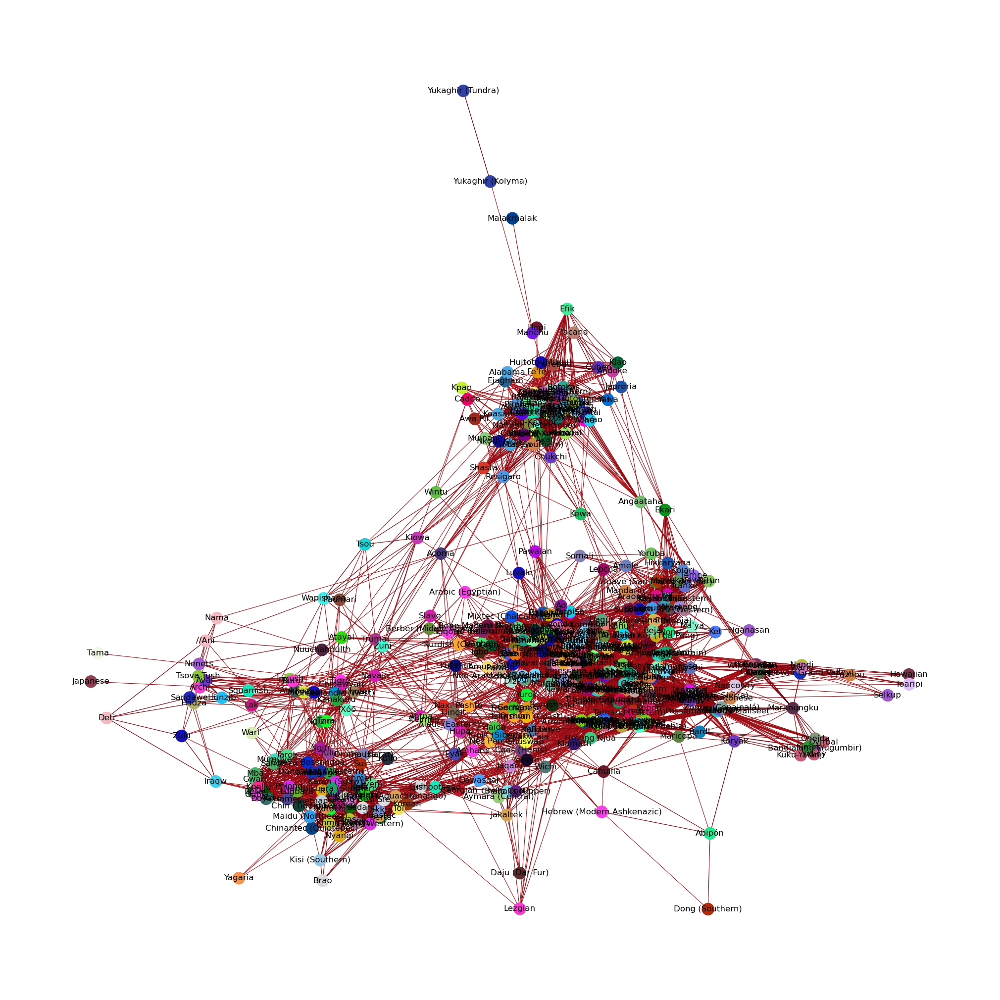

In [ ]:
# plot network with families
plt.figure(figsize=(20,20))
nx.draw(G_lang,
        pos=layout,
        edge_color=weights,
        width=np.array(weights),
        with_labels=True,
        node_color=[color_dict[family_dict[node]] for node in G_lang.nodes()],
        edge_cmap=plt.cm.Reds,
        cmap=plt.cm.Accent)

plt.box(False)
plt.savefig('../results/figures/red_lang_075_families.png',bbox_inches='tight')

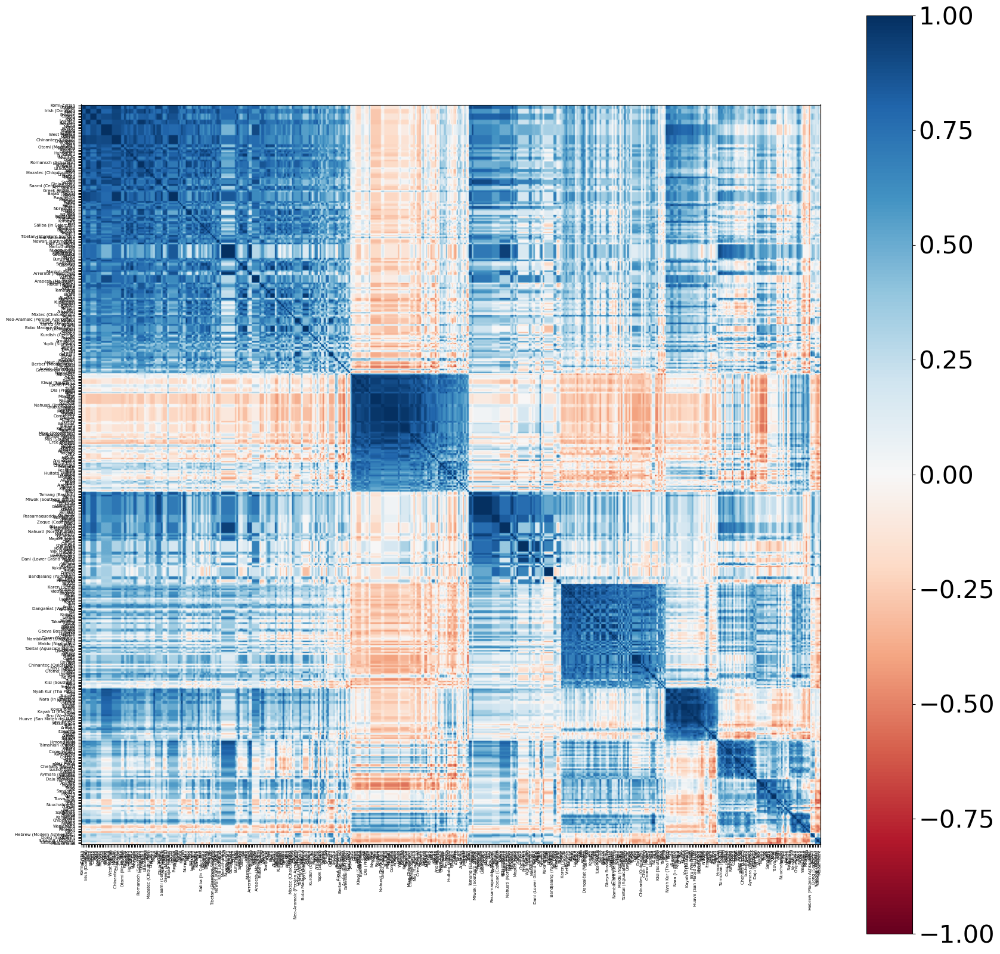

In [ ]:
# plot correlation matrix, but ordering the languages by communities
order_communities = [x for comm in communities_im for x in comm]
plt.figure(figsize=(20,20))
plt.imshow(corr_mat.loc[order_communities,order_communities],cmap='RdBu',vmin=-1,vmax=1)
plt.xticks(ticks=range(len(langs)), labels=order_communities,rotation=90,fontsize=5)
plt.yticks(ticks=range(len(langs)), labels=order_communities,fontsize=5)
colorbar = plt.colorbar()
colorbar.ax.tick_params(labelsize=30)
plt.savefig('../results/figures/correlation_matrix_ordered.png',bbox_inches='tight')

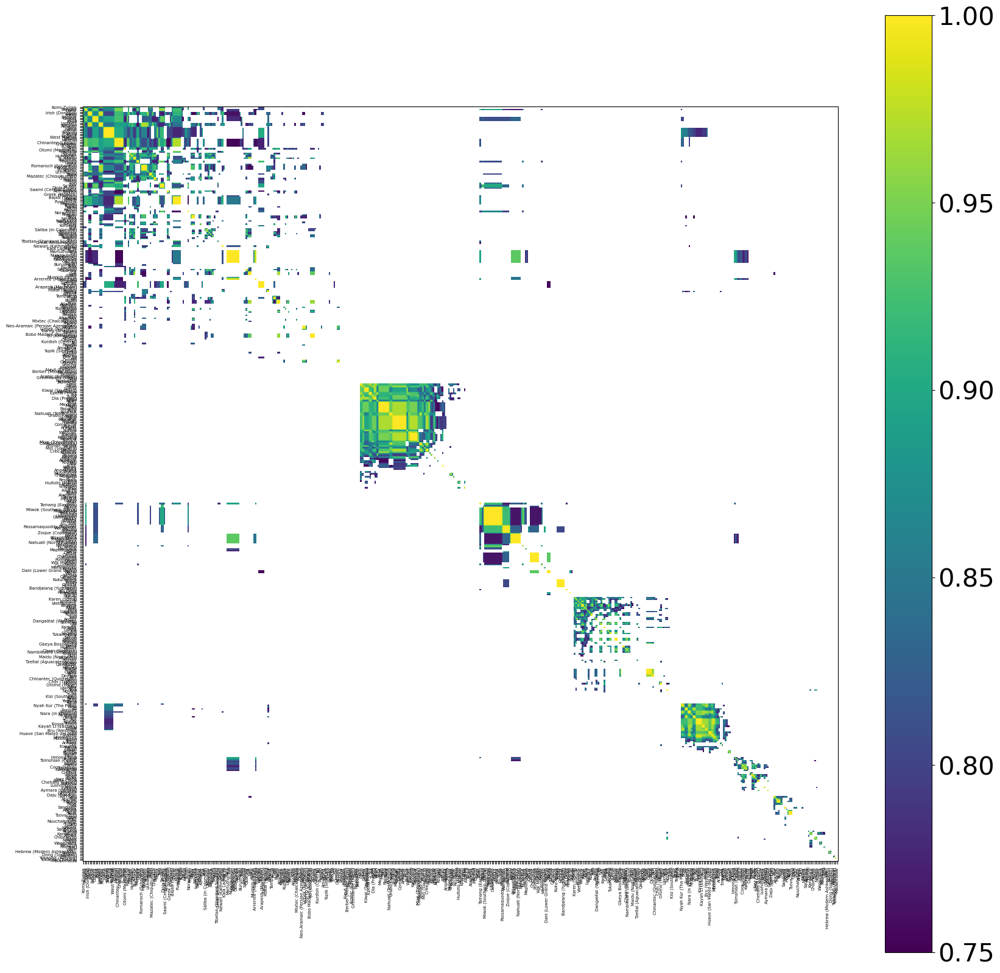

In [ ]:
# plot correlation matrix, but ordering the languages by communities
thres = 0.75
order_communities = [x for comm in communities_im for x in comm]
plt.figure(figsize=(20,20))
plt.imshow(corr_mat[np.abs(corr_mat) > thres].loc[order_communities,order_communities],cmap='viridis',vmin=thres,vmax=1)
plt.xticks(ticks=range(len(langs)), labels=order_communities,rotation=90,fontsize=5)
plt.yticks(ticks=range(len(langs)), labels=order_communities,fontsize=5)
colorbar = plt.colorbar()
colorbar.ax.tick_params(labelsize=30)
plt.savefig('../results/figures/adjacency_matrix_ordered.png',bbox_inches='tight')

## Profiles of the languages and average profiles of the communities

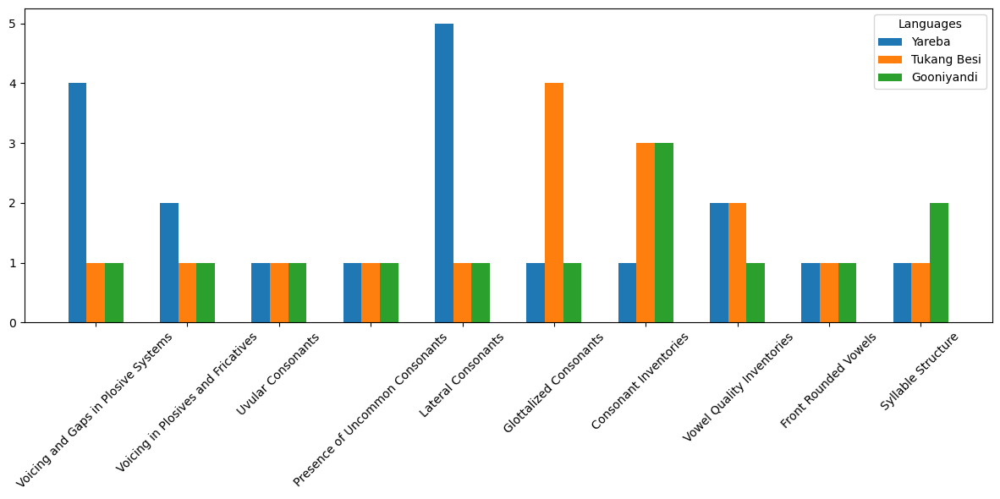

In [ ]:
# phonological profiles of the languages
random_languages = lang_df_nofam.sample(n=3)

fig, ax = plt.subplots(figsize=(12, 6))

width = 0.2  # Width of the bars
positions = np.arange(len(lang_df_nofam.columns))

for i, (idx, row) in enumerate(random_languages.iterrows()):
    ax.bar(positions + i * width, row, width=width, label=idx)

ax.set_xticks(positions + width)
ax.set_xticklabels(lang_df_nofam.columns)
# ax.set_title('Phonological Profile of Three Random Languages')
# ax.set_xlabel('Phonological Characteristics')
# ax.set_ylabel('Values')
ax.legend(title='Languages', fontsize=10)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('../results/figures/phonological_profile_random_langs.png', bbox_inches='tight')


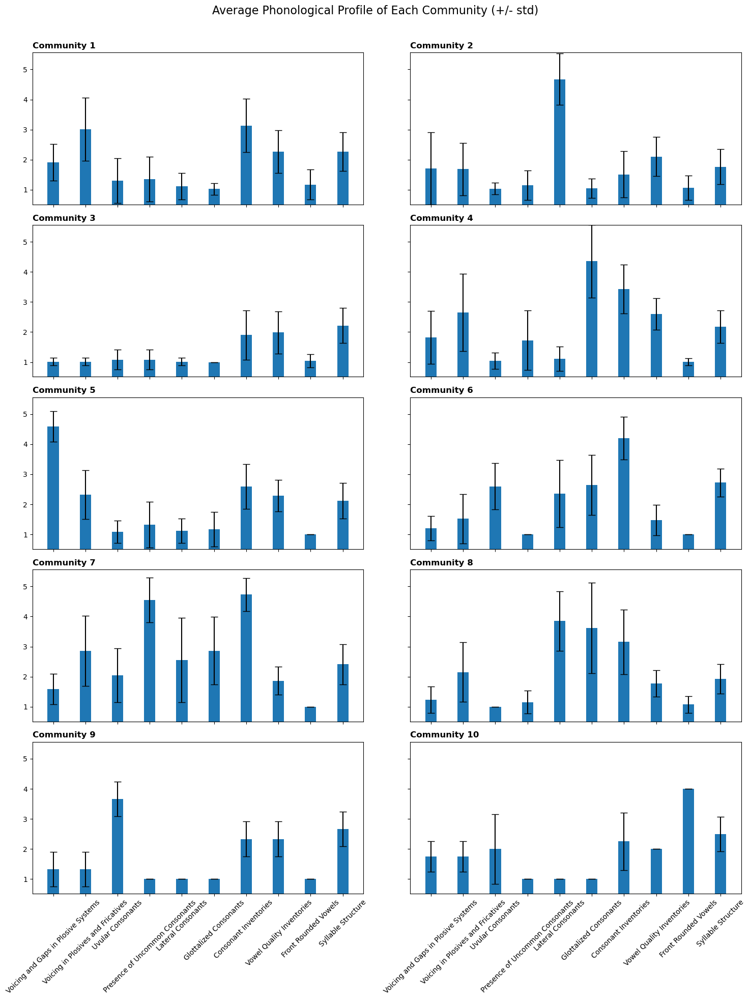

In [ ]:
community_profiles = {}
min_value = float('inf')
max_value = float('-inf')

for idx, community in enumerate(communities_im):
    community_df = lang_df_nofam.loc[community]
    mean_profile = community_df.mean()
    std_profile = community_df.std()
    community_profiles[f'Community {idx+1}'] = (mean_profile, std_profile)
    min_value = min(min_value, (mean_profile - std_profile).min())
    max_value = max(max_value, (mean_profile + std_profile).max())

fig, axes = plt.subplots(5, 2, figsize=(15, 20), sharex=True, sharey=True)

width = 0.35  # Width of the bars
positions = np.arange(len(lang_df_nofam.columns))

for i, (community, (mean_profile, std_profile)) in enumerate(community_profiles.items()):
    ax = axes[i // 2, i % 2]
    ax.bar(positions, mean_profile, yerr=std_profile, width=width, capsize=5)
    ax.set_title(f'Community {i + 1}', loc='left', fontsize=12, fontweight='bold')
    ax.set_ylim(min_value, max_value)
    if (i // 2) == 4:  # Only set x-tick labels for the bottom row
        ax.set_xticks(positions)
        ax.set_xticklabels(lang_df_nofam.columns, rotation=45)
    else:
        ax.set_xticks(positions)
        ax.set_xticklabels([])

fig.suptitle('Average Phonological Profile of Each Community (+/- std)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


## Bipartite network familia-phonologycal community

In [ ]:
# Step 1: Count occurrences of each ('familia', 'community') pair
pair_counts = defaultdict(int)
for node in G_lang.nodes(data=True):
    familia = node[1].get('Familia')
    community = node[1].get('Community')
    if familia is not None and community is not None:
        pair_counts[(familia, community)] += 1

# Step 2: Create a bipartite network
B = nx.Graph()
familia_nodes = set(familia for familia, community in pair_counts.keys())
community_nodes = set(community for familia, community in pair_counts.keys())

B.add_nodes_from(familia_nodes, bipartite=0)  # Add 'familia' nodes
B.add_nodes_from(community_nodes, bipartite=1)  # Add 'community' nodes

# Step 3: Add edges with weights based on the pair counts
for (familia, community), weight in pair_counts.items():
    B.add_edge(familia, community, weight=weight)

# Now B is your bipartite network
# You can visualize or analyze it as needed
print("Bipartite graph created with nodes:")
print("Familia nodes:", familia_nodes)
print("Community nodes:", community_nodes)
print("Edges with weights:", B.edges(data=True))

Bipartite graph created with nodes:
Familia nodes: {'South America\t', 'Alacalufan', 'Niger-Congo\t', 'Mande', 'Iranxe', 'Western Daly', 'Austro-Asiatic', 'Tangkic', 'Warao', 'Witotoan', 'Pano-Tacanan', 'Matacoan', 'Tiwian', 'Torricelli', 'Aymaran', 'Boran', 'other', 'Burushaski', 'Eleman', 'Mixe-Zoque', 'Dravidian', 'Keresan', 'Kordofanian', 'Barbacoan', 'Mangarrayi-Maran', 'Haida', 'Tsimshianic', 'Pama-Nyungan\t', 'Yele', 'Trumai', 'Bunuban', 'Nivkh', 'Iwaidjan', 'Huavean', 'Central Sudanic', 'Hmong-Mien', 'Dogon', 'Zaparoan', 'Tonkawa', 'Ramu-Lower Sepik', 'Sandawe', 'North Bougainville', 'Fulniô', 'Mangrida', 'Zuni', 'Trans-New Guinea', 'Ijoid', 'Austronesian\t', 'Great Andamanese', 'Basque', 'Kunama', 'Yeniseian', 'Border', 'Tucanoan', 'Araucanian', 'Sepik', 'Caddoan', 'Northern Daly', 'Berta', 'Mayan', 'Kxa', 'Senagi', 'Movima', 'Chibchan', 'Cariban', 'Chukotko-Kamchatkan', 'Sáliban', 'Cahuapanan', 'Guaicuruan', 'Nambikuaran', 'Kartvelian', 'Sino-Tibetan\t', 'Maweti-Guarani', 'Si

/tmp/ipykernel_13055/2741433985.py:72: UserWarning: Glyph 9 (	) missing from current font.
  plt.savefig(path_fout, bbox_inches='tight')
/home/juanf/anaconda3/envs/phonology/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


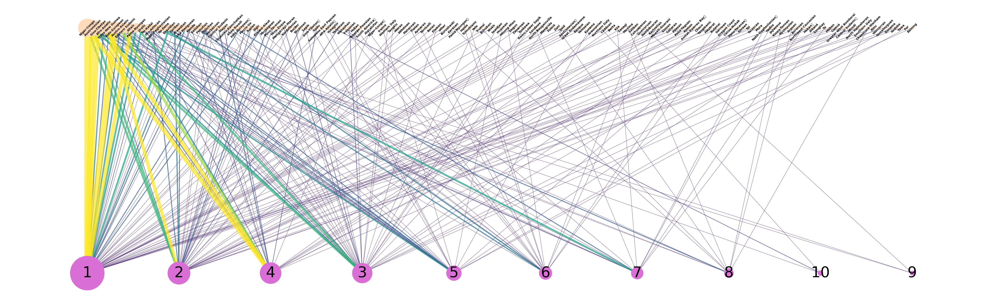

In [ ]:
# Plotting the bipartite network
plot_bipartite_network_horizontal(B,'../results/figures/bipartite_comm_fam.png')

In [ ]:
# profiles of the communities in terms of family composition

In [ ]:
# distribution of communities of each language family
N_eff = dict()
strength = dict()
for fam in familia_nodes:
    strength[fam] = B.degree(fam,weight='weight')
    # print(fam,strength[fam])
    N_eff[fam] = 0.0
    for neigh in B.neighbors(fam):
        p = B[fam][neigh]['weight']/strength[fam]
        N_eff[fam] -= p*np.log(p)
    N_eff[fam] = np.exp(N_eff[fam])

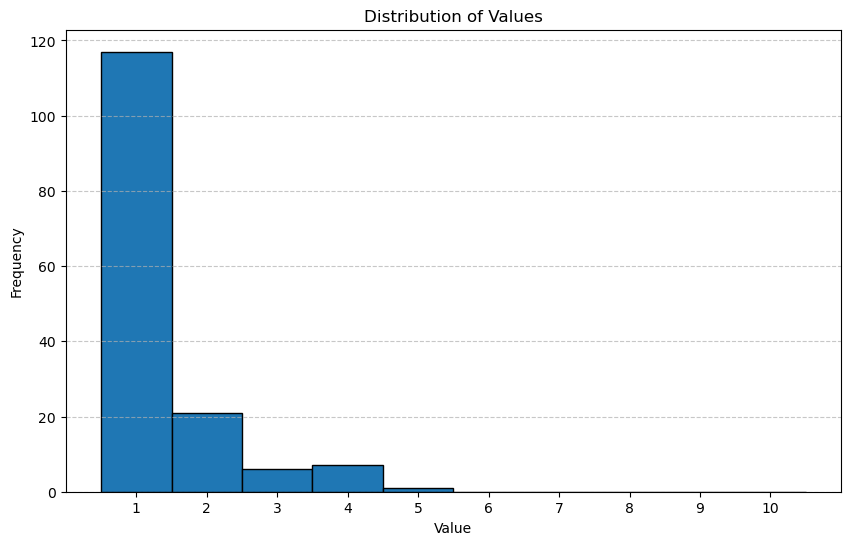

In [ ]:
values = list(N_eff.values())

# Define the bins centered around integers from 1 to 10
bins = [0.5 + i for i in range(11)]  # This will create bins centered at 1, 2, ..., 10

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(values, bins=bins, edgecolor='black', align='mid')
plt.xticks(range(1, 11))
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Values')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Now for communities
N_eff_comm = dict()
strength_comm = dict()
for comm in community_nodes:
    strength_comm[comm] = B.degree(comm,weight='weight')
    N_eff_comm[comm] = 0.0
    for neigh in B.neighbors(comm):
        p = B[comm][neigh]['weight']/strength_comm[comm]
        N_eff_comm[comm] -= p*np.log(p)
    N_eff_comm[comm] = np.exp(N_eff_comm[comm])
    print(N_eff_comm[comm]/B.degree(comm))
# print(N_eff_comm[1], B.degree(1, weight='weight'), strength_comm[1])
# for neigh in B.neighbors(1):
#     print(B[1][neigh]['weight'])

0.5051759555909723
0.7040856949259346
0.7594247634909065
0.5985483381947336
0.839166588960879
0.844359143133488
0.7791897382245307
0.9171613865937538
0.9999999999999999
0.9428090415820632


In [ ]:
print(N_eff_comm)

{1: 29.300205424276392, 2: 27.45934210211145, 3: 28.09871624916354, 4: 13.16806344028414, 5: 16.78333177921758, 6: 16.042823719536273, 7: 10.90865633514343, 8: 10.088775252531292, 9: 2.9999999999999996, 10: 2.82842712474619}


In [ ]:
print(len(familia_nodes))

152
